In [28]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from scipy.optimize import linear_sum_assignment
from sklearn.metrics import confusion_matrix

# Seminar 3: K-means

Javier González Otero - 243078

Jordi Guillén González - 253027

David Sánchez Maldonado - 253798

## Part I: Data preparation & analysis

### Data load

In [2]:
rssi_data_fp = "data/rssi_data.csv"
labels_data_fp = "data/labels_data.csv"
rssi_df = pd.read_csv(rssi_data_fp, sep=r',', header=None)
labels_df = pd.read_csv(labels_data_fp, sep=r',', header=None)
dataframe = pd.concat([rssi_df,labels_df],axis = 1)
dataframe.columns = ["AP1","AP2","AP3","Label"]
dataframe.head()

,AP1,AP2,AP3,Label
0,-21.949,-99.659,-42.257,5
1,-34.049,-95.964,-47.779,4
2,-18.861,-100.000,-34.175,5
3,-53.497,-77.368,-67.360,2
4,-54.986,-73.012,-69.780,2


### 2D-Plots comparing RSSI percived by each pair of AP

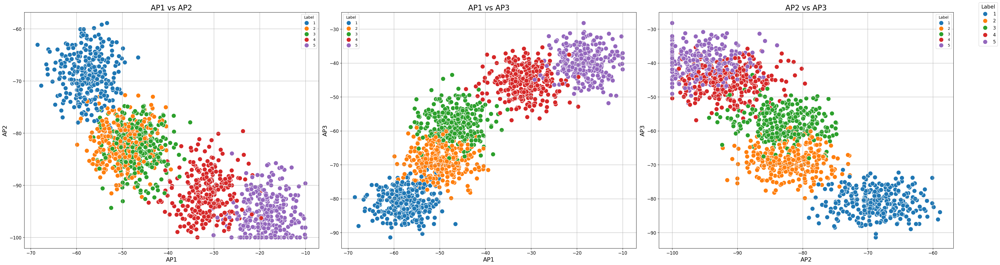

In [5]:
# Create a single row with 3 larger subplots
fig, axes = plt.subplots(1, 3, figsize=(36, 10))  

# Plot AP1 vs AP2
sns.scatterplot(data=dataframe, x='AP1', y='AP2', hue='Label', palette='tab10', s=150, ax=axes[0])
axes[0].set_title('AP1 vs AP2', fontsize=20)
axes[0].set_xlabel('AP1', fontsize=16)
axes[0].set_ylabel('AP2', fontsize=16)
axes[0].tick_params(labelsize=12)
axes[0].grid(True)

# Plot AP1 vs AP3
sns.scatterplot(data=dataframe, x='AP1', y='AP3', hue='Label', palette='tab10', s=150, ax=axes[1])
axes[1].set_title('AP1 vs AP3', fontsize=20)
axes[1].set_xlabel('AP1', fontsize=16)
axes[1].set_ylabel('AP3', fontsize=16)
axes[1].tick_params(labelsize=12)
axes[1].grid(True)

# Plot AP2 vs AP3
sns.scatterplot(data=dataframe, x='AP2', y='AP3', hue='Label', palette='tab10', s=150, ax=axes[2])
axes[2].set_title('AP2 vs AP3', fontsize=20)
axes[2].set_xlabel('AP2', fontsize=16)
axes[2].set_ylabel('AP3', fontsize=16)
axes[2].tick_params(labelsize=12)
axes[2].grid(True)

# Adjust layout
plt.tight_layout()

# Set legend only once, outside the last plot
handles, labels = axes[2].get_legend_handles_labels()
fig.legend(handles, labels, title='Label', bbox_to_anchor=(1.02, 1), loc='upper left', fontsize=12, title_fontsize=14)

plt.show()

### 3D-Plot comparing RSSI percived by all APs

In [23]:
def plot_3d_rssi(dataframe, label_column='Label'):
    """
    Plots a 3D scatter plot of RSSI values from three access points using Plotly.

    Parameters:
        dataframe (pd.DataFrame): DataFrame containing 'AP1', 'AP2', 'AP3', and a label column.
        label_column (str): Name of the column containing the labels for coloring (default is 'Label').

    Returns:
        plotly.graph_objects.Figure: The interactive 3D scatter plot.
    """
    # Ensure labels are treated as categorical
    dataframe = dataframe.copy()
    dataframe[label_column] = dataframe[label_column].astype(str)

    # Create 3D scatter plot with discrete coloring
    fig = px.scatter_3d(
        dataframe,
        x='AP1',
        y='AP2',
        z='AP3',
        color=label_column,
        color_discrete_sequence=px.colors.qualitative.T10,
        title='3D RSSI Distribution from AP1, AP2, and AP3',
        labels={'AP1': 'AP1 (RSSI)', 'AP2': 'AP2 (RSSI)', 'AP3': 'AP3 (RSSI)'}
    )

    # Customize marker size and layout
    fig.update_traces(marker=dict(size=4))
    fig.update_layout(scene=dict(
        xaxis_title='AP1',
        yaxis_title='AP2',
        zaxis_title='AP3'
    ))
    return fig

In [24]:
plot_3d_rssi(dataframe, label_column='Label').show()

### Location statistics

In [17]:
# Compute mean and standard deviation of RSSI per point (Label)
mean_df = dataframe.groupby('Label')[['AP1', 'AP2', 'AP3']].mean().T
std_df = dataframe.groupby('Label')[['AP1', 'AP2', 'AP3']].std().T

# Combine into a single DataFrame
summary_df = pd.concat([mean_df, std_df], keys=['Mean', 'Std'])

# Show the result
summary_df

Label             1          2          3          4          5
Mean AP1 -57.547793 -49.811667 -46.740827 -31.584760 -18.477953
     AP2 -68.772187 -81.979633 -82.877667 -91.492630 -95.344790
     AP3 -81.156930 -68.978473 -57.633320 -45.475647 -40.081403
Std  AP1   3.676167   3.892066   3.951756   4.058027   3.860880
     AP2   4.041594   3.760133   3.981708   3.944587   3.531129
     AP3   3.748209   3.869161   4.141495   4.102736   4.128701

## Part 2: K-means Algorithm implementation

In [18]:
def kmeans_rssi(dataframe, k=5, max_iter=100, seed=None):
    """
    Applies K-means clustering to RSSI data from 3 access points.

    Parameters:
        dataframe (pd.DataFrame): DataFrame with columns ['AP1', 'AP2', 'AP3'] containing RSSI measurements.
        k (int): Number of clusters to form (default is 5).
        max_iter (int): Maximum number of iterations before stopping (default is 100).
        seed (int, optional): Random seed for reproducibility.

    Returns:
        pd.DataFrame: A copy of the input DataFrame with an added column 'PredictedLabel' (values from 1 to k),
                      indicating the assigned cluster for each row.
    """
    
    if seed is not None:
        np.random.seed(seed)
    
    # Step 1: Convert to NumPy array
    X = dataframe[['AP1', 'AP2', 'AP3']].values
    n_samples = X.shape[0]

    # Step 2: Random initialization of centroids in the data space
    min_vals = X.min(axis=0)
    max_vals = X.max(axis=0)
    centroids = np.random.uniform(low=min_vals, high=max_vals, size=(k, 3))

    # Step 3: Iterative optimization
    prev_labels = None

    for _ in range(max_iter):
        # Step 3.1: Assign each point to the closest centroid
        distances = np.linalg.norm(X[:, np.newaxis] - centroids, axis=2)  # shape (n_samples, k)
        labels = np.argmin(distances, axis=1)

        # Step 3.2: Check for convergence
        if prev_labels is not None and np.array_equal(labels, prev_labels):
            break
        prev_labels = labels.copy()

        # Step 3.3: Update centroids
        for i in range(k):
            cluster_points = X[labels == i]
            if len(cluster_points) == 0:
                # Reinitialize empty centroid
                centroids[i] = np.random.uniform(low=min_vals, high=max_vals, size=3)
            else:
                centroids[i] = cluster_points.mean(axis=0)

    # Step 4: Add predicted labels (starting from 1)
    dataframe = dataframe.copy()
    dataframe['PredictedLabel'] = labels + 1
    return dataframe

In [19]:
rssi_dataframe = dataframe.iloc[:, :-1] # eliminate label column

predicted_dataframe = kmeans_rssi(rssi_dataframe, k=5, max_iter=100, seed=None)

In [40]:
plot_3d_rssi(predicted_dataframe, label_column='PredictedLabel').show()

## Extra: Label alignment

K-means is an unsupervised learning algorithm, hence it is not able to learn which label corresponds to which cluster.

In [34]:
def align_kmeans_labels(true_labels, predicted_labels):
    """
    Aligns predicted K-means labels to true labels using the Hungarian algorithm.

    Parameters:
        true_labels (array-like): Ground truth labels.
        predicted_labels (array-like): Labels output by K-means.

    Returns:
        np.ndarray: Aligned predicted labels.
    """
    cm = confusion_matrix(true_labels, predicted_labels)
    row_ind, col_ind = linear_sum_assignment(-cm)
    mapping = {pred: true for pred, true in zip(col_ind, row_ind)}
    return np.array([mapping.get(x, x) for x in predicted_labels])  # use default fallback


In [37]:
dataframe['PredictedLabel'] = predicted_dataframe['PredictedLabel'].values # Add predicted label column to dataframe

# Apply Hungarian algorithm to DataFrame
dataframe['PredictedLabel'] = align_kmeans_labels(
    dataframe['Label'].astype(int).values,
    dataframe['PredictedLabel'].astype(int).values
)

In [39]:
plot_3d_rssi(dataframe, label_column='PredictedLabel').show()

In [42]:
# Convert both columns to integers
true_labels = dataframe['Label'].astype(int)
pred_labels = dataframe['PredictedLabel'].astype(int)

# Compute confusion matrix
cm = confusion_matrix(true_labels, pred_labels)

# Display as labeled DataFrame
print(pd.DataFrame(
    cm,
    index=[f'True {i}' for i in sorted(true_labels.unique())],
    columns=[f'Pred {i}' for i in sorted(pred_labels.unique())]
))

ValueError: Shape of passed values is (6, 6), indices imply (5, 5)